Question 2.1

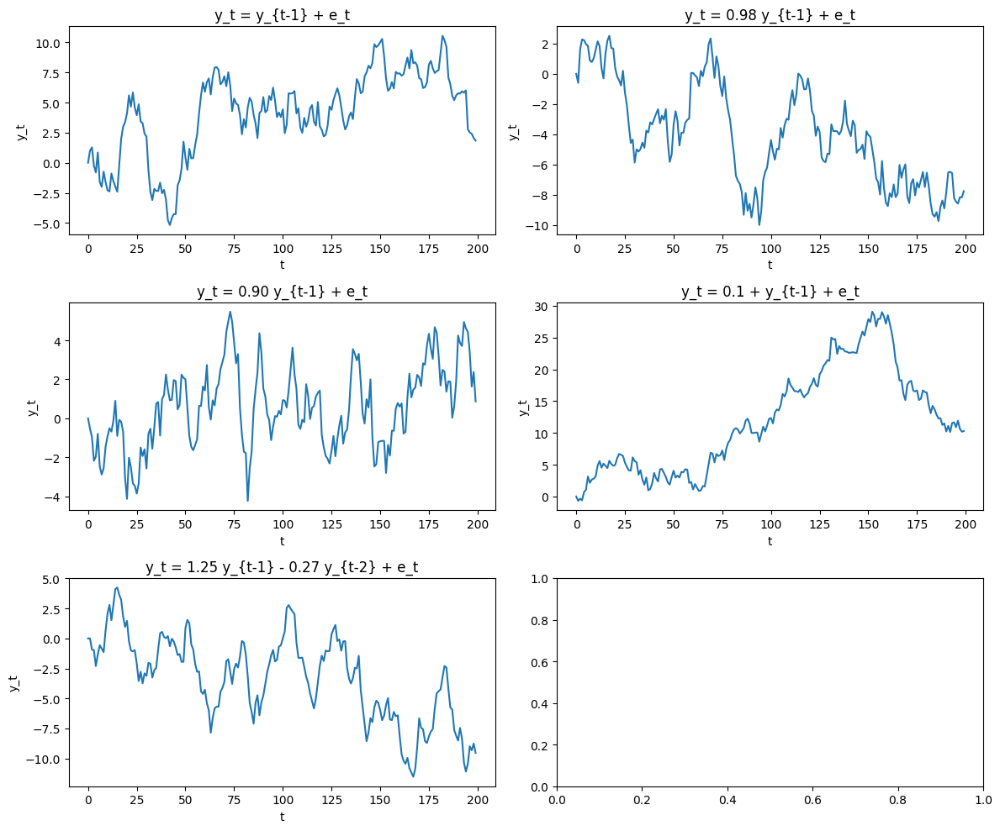

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller, kpss
import pandas as pd

np.random.seed(123)

# Fonction de simulation AR(p)
def simulate_ar(n, phi, c=0):
    p = len(phi)
    e = np.random.normal(0, 1, n)
    y = np.zeros(n)

    for t in range(p, n):
        ar_part = sum(phi[i] * y[t - i - 1] for i in range(p))
        y[t] = c + ar_part + e[t]

    return y

n = 200

# 1) y_t = y_{t-1} + e_t
y1 = simulate_ar(n, phi=[1])

# 2) y_t = 0.98 y_{t-1} + e_t
y2 = simulate_ar(n, phi=[0.98])

# 3) y_t = 0.90 y_{t-1} + e_t
y3 = simulate_ar(n, phi=[0.90])

# 4) y_t = 0.1 + y_{t-1} + e_t
y4 = simulate_ar(n, phi=[1], c=0.1)

# 5) y_t = 1.25 y_{t-1} - 0.27 y_{t-2} + e_t
y5 = simulate_ar(n, phi=[1.25, -0.27])

# Graphiques
fig, axs = plt.subplots(3, 2, figsize=(12, 10))

series = [(y1, "y_t = y_{t-1} + e_t"),
          (y2, "y_t = 0.98 y_{t-1} + e_t"),
          (y3, "y_t = 0.90 y_{t-1} + e_t"),
          (y4, "y_t = 0.1 + y_{t-1} + e_t"),
          (y5, "y_t = 1.25 y_{t-1} - 0.27 y_{t-2} + e_t")]

for ax, (data, title) in zip(axs.flatten(), series):
    ax.plot(data)
    ax.set_title(title)
    ax.set_xlabel("t")
    ax.set_ylabel("y_t")

plt.tight_layout()
plt.show()


In [ ]:
#monte carlo simulation

models = {
    "A": {"phi": [1.0],          "c": 0.0},   # racine unitaire
    "B": {"phi": [0.98],         "c": 0.0},   # stationnaire
    "C": {"phi": [0.90],         "c": 0.0},   # stationnaire
    "D": {"phi": [1.0],          "c": 0.1},   # racine unitaire + drift
    "E": {"phi": [1.25, -0.27],  "c": 0.0},   # AR(2) stationnaire
}

def monte_carlo(n=200, R=5000):
    results = pd.DataFrame(0.0, index=models.keys(),
                           columns=["ADF_c","ADF_ct","KPSS_c","KPSS_ct"])

    for name, pars in models.items():
        phi = pars["phi"]
        c   = pars["c"]

        for r in range(R):
            y = simulate_ar(n, phi, c)

            # ADF regression="c"
            adf_c = adfuller(y, regression="c", autolag=None, maxlag=2)
            if adf_c[0] < adf_c[4]["5%"]:   # rejet H0 racine unitaire
                results.loc[name, "ADF_c"] += 1

            # ADF regression="ct"
            adf_ct = adfuller(y, regression="ct", autolag=None, maxlag=2)
            if adf_ct[0] < adf_ct[4]["5%"]:
                results.loc[name, "ADF_ct"] += 1

            # KPSS regression="c"
            kpss_c = kpss(y, regression="c", nlags=2)
            if kpss_c[0] > kpss_c[3]["5%"]:  # rejet H0 stationnarité
                results.loc[name, "KPSS_c"] += 1

            # KPSS regression="ct"
            kpss_ct = kpss(y, regression="ct", nlags=2)
            if kpss_ct[0] > kpss_ct[3]["5%"]:
                results.loc[name, "KPSS_ct"] += 1

    # On normalise pour obtenir des taux de rejet
    return results / R

# Lancer la simulation Monte Carlo
reject_rates = monte_carlo()

print("\n=== Taux de rejet (Monte Carlo 5%) ===\n")
print(reject_rates)

C:\Users\masth\AppData\Local\Temp\ipykernel_9180\3758734184.py:35: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_c = kpss(y, regression="c", nlags=2)
C:\Users\masth\AppData\Local\Temp\ipykernel_9180\3758734184.py:40: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_ct = kpss(y, regression="ct", nlags=2)
C:\Users\masth\AppData\Local\Temp\ipykernel_9180\3758734184.py:35: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_c = kpss(y, regression="c", nlags=2)
C:\Users\masth\AppData\Local\Temp\ipykernel_9180\3758734184.py:40: InterpolationWarning: The test statistic is outside of the range of p-values available in the
loo


=== Taux de rejet (Monte Carlo 5%) ===

    ADF_c  ADF_ct  KPSS_c  KPSS_ct
A  0.0456  0.0458  0.9828   0.9956
B  0.0912  0.0690  0.9502   0.9890
C  0.7438  0.5030  0.7008   0.8960
D  0.0332  0.0488  0.9936   0.9926
E  0.1266  0.0868  0.9370   0.9878


C:\Users\masth\AppData\Local\Temp\ipykernel_9180\3758734184.py:35: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_c = kpss(y, regression="c", nlags=2)
C:\Users\masth\AppData\Local\Temp\ipykernel_9180\3758734184.py:40: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_ct = kpss(y, regression="ct", nlags=2)
C:\Users\masth\AppData\Local\Temp\ipykernel_9180\3758734184.py:35: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_c = kpss(y, regression="c", nlags=2)
C:\Users\masth\AppData\Local\Temp\ipykernel_9180\3758734184.py:40: InterpolationWarning: The test statistic is outside of the range of p-values available in the
loo

In [ ]:
import numpy as np
import pandas as pd

# On rappelle quels modèles sont stationnaires ou non
stationary_models = ["B", "C", "E"]      # vrais stationnaires
nonstationary_models = ["A", "D"]        # non stationnaires (racine unitaire)

# Initialiser deux tableaux : un pour la taille, un pour la puissance
size_table = pd.DataFrame(np.nan, index=reject_rates.index, columns=reject_rates.columns)
power_table = pd.DataFrame(np.nan, index=reject_rates.index, columns=reject_rates.columns)

for model in reject_rates.index:
    for test in reject_rates.columns:
        rate = reject_rates.loc[model, test]
        is_adf = test.startswith("ADF")    # ADF_c, ADF_ct
        is_kpss = test.startswith("KPSS")  # KPSS_c, KPSS_ct

        if is_adf:
            # H0 ADF : racine unitaire (non stationnaire)
            if model in nonstationary_models:
                # H0 vraie -> rejet = TAILLE
                size_table.loc[model, test] = rate
            else:
                # H0 fausse -> rejet = PUISSANCE
                power_table.loc[model, test] = rate

        if is_kpss:
            # H0 KPSS : stationnarité
            if model in stationary_models:
                # H0 vraie -> rejet = TAILLE
                size_table.loc[model, test] = rate
            else:
                # H0 fausse -> rejet = PUISSANCE
                power_table.loc[model, test] = rate

print("\n=== Taille (probabilité de rejeter H0 quand H0 est vraie) ===\n")
print(size_table.round(3))

print("\n=== Puissance (probabilité de rejeter H0 quand H0 est fausse) ===\n")
print(power_table.round(3))



=== Taille (probabilité de rejeter H0 quand H0 est vraie) ===

   ADF_c  ADF_ct  KPSS_c  KPSS_ct
A  0.046   0.046     NaN      NaN
B    NaN     NaN   0.950    0.989
C    NaN     NaN   0.701    0.896
D  0.033   0.049     NaN      NaN
E    NaN     NaN   0.937    0.988

=== Puissance (probabilité de rejeter H0 quand H0 est fausse) ===

   ADF_c  ADF_ct  KPSS_c  KPSS_ct
A    NaN     NaN   0.983    0.996
B  0.091   0.069     NaN      NaN
C  0.744   0.503     NaN      NaN
D    NaN     NaN   0.994    0.993
E  0.127   0.087     NaN      NaN
